Cardiovascular disease(CVD) is one of the main reasons for the troublesome lives of humans and could lead to the end of life at an early stage. The main idea to aviod it is a healthy lifestyle and, along with it, regular checkups about health conditions. Early recognition of the health issues could lead to a healthy life once again. Here I have tried to explore the different machine learning models and make comparisons among them, which, probably in the future, can be the best weapon to detect CVD with the help of other biological parameters. Let's roam through the code.

Importing the data

In [4]:
#importing the basic library for data analysis
import pandas as pd
data_path=r'C:\Users\posha\OneDrive\Desktop\University\First semester\machine learning\CVD_cleaned.csv'
data= pd.read_csv(data_path)

In [5]:
data.shape
data.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150.0,32.66,14.54,Yes,0.0,30.0,16.0,12.0
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165.0,77.11,28.29,No,0.0,30.0,0.0,4.0
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163.0,88.45,33.47,No,4.0,12.0,3.0,16.0
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180.0,93.44,28.73,No,0.0,30.0,30.0,8.0
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191.0,88.45,24.37,Yes,0.0,8.0,4.0,0.0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308854 entries, 0 to 308853
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   General_Health                308854 non-null  object 
 1   Checkup                       308854 non-null  object 
 2   Exercise                      308854 non-null  object 
 3   Heart_Disease                 308854 non-null  object 
 4   Skin_Cancer                   308854 non-null  object 
 5   Other_Cancer                  308854 non-null  object 
 6   Depression                    308854 non-null  object 
 7   Diabetes                      308854 non-null  object 
 8   Arthritis                     308854 non-null  object 
 9   Sex                           308854 non-null  object 
 10  Age_Category                  308854 non-null  object 
 11  Height_(cm)                   308854 non-null  float64
 12  Weight_(kg)                   308854 non-nul

In [7]:
data.isnull().sum()

General_Health                  0
Checkup                         0
Exercise                        0
Heart_Disease                   0
Skin_Cancer                     0
Other_Cancer                    0
Depression                      0
Diabetes                        0
Arthritis                       0
Sex                             0
Age_Category                    0
Height_(cm)                     0
Weight_(kg)                     0
BMI                             0
Smoking_History                 0
Alcohol_Consumption             0
Fruit_Consumption               0
Green_Vegetables_Consumption    0
FriedPotato_Consumption         0
dtype: int64

In [8]:
data.duplicated().sum()

80

Data Cleaning

In [9]:
#drop the duplicate the values
data.drop_duplicates()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150.0,32.66,14.54,Yes,0.0,30.0,16.0,12.0
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165.0,77.11,28.29,No,0.0,30.0,0.0,4.0
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163.0,88.45,33.47,No,4.0,12.0,3.0,16.0
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180.0,93.44,28.73,No,0.0,30.0,30.0,8.0
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191.0,88.45,24.37,Yes,0.0,8.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308849,Very Good,Within the past year,Yes,No,No,No,No,No,No,Male,25-29,168.0,81.65,29.05,No,4.0,30.0,8.0,0.0
308850,Fair,Within the past 5 years,Yes,No,No,No,No,Yes,No,Male,65-69,180.0,69.85,21.48,No,8.0,15.0,60.0,4.0
308851,Very Good,5 or more years ago,Yes,No,No,No,Yes,"Yes, but female told only during pregnancy",No,Female,30-34,157.0,61.23,24.69,Yes,4.0,40.0,8.0,4.0
308852,Very Good,Within the past year,Yes,No,No,No,No,No,No,Male,65-69,183.0,79.38,23.73,No,3.0,30.0,12.0,0.0


In [10]:
#Checking the number of unique values
data.select_dtypes(include='object').nunique()

General_Health      5
Checkup             5
Exercise            2
Heart_Disease       2
Skin_Cancer         2
Other_Cancer        2
Depression          2
Diabetes            4
Arthritis           2
Sex                 2
Age_Category       13
Smoking_History     2
dtype: int64

About the data:
    Data contain 308774 rows and 19 columns and the target column i.e. heart_disease contain the two unique object values.
    

In [11]:
#getting the idea of unique values
unique_values_per_column = {}
for column in data.columns:
    unique_values = data[column].unique()
    unique_values_per_column[column] = unique_values

for column, values in unique_values_per_column.items():
    print(f"{column}: \n\n {values}\n")


General_Health: 

 ['Poor' 'Very Good' 'Good' 'Fair' 'Excellent']

Checkup: 

 ['Within the past 2 years' 'Within the past year' '5 or more years ago'
 'Within the past 5 years' 'Never']

Exercise: 

 ['No' 'Yes']

Heart_Disease: 

 ['No' 'Yes']

Skin_Cancer: 

 ['No' 'Yes']

Other_Cancer: 

 ['No' 'Yes']

Depression: 

 ['No' 'Yes']

Diabetes: 

 ['No' 'Yes' 'No, pre-diabetes or borderline diabetes'
 'Yes, but female told only during pregnancy']

Arthritis: 

 ['Yes' 'No']

Sex: 

 ['Female' 'Male']

Age_Category: 

 ['70-74' '60-64' '75-79' '80+' '65-69' '50-54' '45-49' '18-24' '30-34'
 '55-59' '35-39' '40-44' '25-29']

Height_(cm): 

 [150. 165. 163. 180. 191. 183. 175. 160. 168. 178. 152. 157. 188. 185.
 170. 173. 155. 193. 196. 206. 198. 140. 135. 145. 147. 142. 201. 218.
 124. 203. 137. 122. 216. 224. 229. 151. 177. 164. 162. 156. 153. 169.
 167. 172. 106. 190. 143. 171. 154. 176. 200. 146. 148. 158. 159. 187.
 104. 120. 107. 211. 226. 182. 213.  97. 184. 125. 127. 234. 130. 119.

In [12]:
# Convering the column names into lower case
data.columns = data.columns.str.lower()
#making the head of the column more amenable
data.rename(columns = {'green_vegetables_consumption' : 'veggie_intake', 'friedpotato_consumption' : 'potato_intake', 'smoking_history' : 'smoking', 'alcohol_consumption' : 'alcohol_intake','fruit_consumption' : 'fruit_intake'}, inplace = True)

In [13]:
#changining the float values of certain column into integer
col = ['alcohol_intake', 'fruit_intake', 'veggie_intake', 'potato_intake']
for i in col:
    data[i] = data[i].astype(int)

In [14]:
#auditing the parameters of the certian columns in appropriate way
data['checkup'] = data['checkup'].replace('Within the past 2 years', 'Past 2 years')
data['checkup'] = data['checkup'].replace('Within the past year', 'Past 1 year')
data['checkup'] = data['checkup'].replace('Within the past 5 years', 'Past 5 years')
data['checkup'] = data['checkup'].replace('5 or more years ago', 'More than 5 years')
data['diabetes'] = data['diabetes'].replace('No, pre-diabetes or borderline diabetes', 'No Pre Diabetes')
data['diabetes'] = data['diabetes'].replace('Yes, but female told only during pregnancy', 'Only during pregnancy')

In [15]:
age_ranges = {
    '18-24': 'Young',
    '25-29': 'Adult',
    '30-34': 'Adult',
    '35-39': 'Adult',
    '40-44': 'Mid-Aged',
    '45-49': 'Mid-Aged',
    '50-54': 'Mid-Aged',
    '55-59': 'Senior-Adult',
    '60-64': 'Senior-Adult',
    '65-69': 'Elderly',
    '70-74': 'Elderly',
    '75-79': 'Elderly',
    '80+': 'Elderly'}

data['age_category'] = data['age_category'].map(age_ranges)

In [16]:
#getting the maximum and minumum vale of BMI, so that we can classify it.
max_bmi = data['bmi'].max()
min_bmi = data['bmi'].min()
print(max_bmi,min_bmi)

99.33 12.02


In [17]:
# Define BMI ranges and labels for each group
bmi_bins = [12.02, 18.5, 25, 30, 35,40, 100]
bmi_labels = ['underweight', 'healthy_weight', 'overweight', 'obese_I', 'obese_II','severe_obesity']
data['bmi_group'] = pd.cut(data['bmi'], bins=bmi_bins, labels=bmi_labels, right=False)
#the bmi labels are calssify on the basis of international standard, ref:centre of disese control and prevention

In [18]:
#once again navigating the changes in data
data.head()

,general_health,checkup,exercise,heart_disease,skin_cancer,other_cancer,depression,diabetes,arthritis,sex,age_category,height_(cm),weight_(kg),bmi,smoking,alcohol_intake,fruit_intake,veggie_intake,potato_intake,bmi_group
0,Poor,Past 2 years,No,No,No,No,No,No,Yes,Female,Elderly,150.0,32.66,14.54,Yes,0,30,16,12,underweight
1,Very Good,Past 1 year,No,Yes,No,No,No,Yes,No,Female,Elderly,165.0,77.11,28.29,No,0,30,0,4,overweight
2,Very Good,Past 1 year,Yes,No,No,No,No,Yes,No,Female,Senior-Adult,163.0,88.45,33.47,No,4,12,3,16,obese_I
3,Poor,Past 1 year,Yes,Yes,No,No,No,Yes,No,Male,Elderly,180.0,93.44,28.73,No,0,30,30,8,overweight
4,Good,Past 1 year,No,No,No,No,No,No,No,Male,Elderly,191.0,88.45,24.37,Yes,0,8,4,0,healthy_weight


In [19]:
data.describe()

,height_(cm),weight_(kg),bmi,alcohol_intake,fruit_intake,veggie_intake,potato_intake
count,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000
mean,170.615249,83.588655,28.626211,5.096366,29.835200,15.110441,6.296616
std,10.658026,21.343210,6.522323,8.199763,24.875735,14.926238,8.582954
min,91.000000,24.950000,12.020000,0.000000,0.000000,0.000000,0.000000
25%,163.000000,68.040000,24.210000,0.000000,12.000000,4.000000,2.000000
50%,170.000000,81.650000,27.440000,1.000000,30.000000,12.000000,4.000000
75%,178.000000,95.250000,31.850000,6.000000,30.000000,20.000000,8.000000
max,241.000000,293.020000,99.330000,30.000000,120.000000,128.000000,128.000000


In [20]:
#for object type data columns
data.describe(include= "O")

,general_health,checkup,exercise,heart_disease,skin_cancer,other_cancer,depression,diabetes,arthritis,sex,age_category,smoking
count,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854
unique,5,5,2,2,2,2,2,4,2,2,5,2
top,Very Good,Past 1 year,Yes,No,No,No,No,No,No,Female,Elderly,No
freq,110395,239371,239381,283883,278860,278976,246953,259141,207783,160196,107513,183590


From the analysis, it is clearly seen that most of the people do exercise regularly and they do regular health ckechups too. They do have avrgae height 170.61 and weight of 83.58 with average BMI of 26.62.


Data Visualization

In [21]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [22]:
import plotly.express as px
colors = px.colors.sequential.Viridis_r
fig1 = px.histogram(data, x="general_health", color = 'general_health', color_discrete_sequence = colors)
fig1.update_layout(width=950, height=500, plot_bgcolor='lightgrey')
fig1.update_layout(
    xaxis_title_font=dict(family='cambria', size=14, color='black'),  # Change font of x-axis title
    yaxis_title_font=dict(family='cambria', size=14, color='black'),  # Change font of y-axis title
    title_font=dict(family='cambria', size=18, color='black'),  # Change font of figure title
)
# Adding figure name at the bottom
fig1.add_annotation(
    x=0.5,
    y=-0.18,
    xref="paper",
    yref="paper",
    text="Figure: Distribution of general health",
    showarrow=False,
    font=dict(
        family="Cambria",
        size=12,
        color="black"
    )
)

# Save the image locally
#fig1.write_image("general_health.png")
#fig1.show()
print('\n')

In [24]:
import plotly.graph_objects as go

fig1 = px.histogram(data, x="arthritis", color='heart_disease', color_discrete_sequence=colors)
fig1.update_layout(width=950, height=500, plot_bgcolor='lightgrey')
#fig1.update_layout(
    #title_font=dict(family='Cambria', size=18, color='black'),  # Change font of figure title)

# Changing the title of the x-axis and y-axis
fig1.update_xaxes(title_text="Arthritis", title_font=dict(family='Cambria', size=16, color='black'))
fig1.update_yaxes(title_text="Frequency", title_font=dict(family='Cambria', size=16, color='black'))

# Adding figure name at the bottom
fig1.add_annotation(
    x=0.5,
    y=-0.18,
    xref="paper",
    yref="paper",
    text="Figure 1: Distribution of Arthritis along with heart disease",
    showarrow=False,
    font=dict(
        family="Cambria",
        size=12,
        color="black"
    )
)
# Save the image locally
fig1.write_image("arthritisupdate.png")
fig1.show()


In [ ]:

fig2 = px.histogram(data, x="smoking", color='heart_disease', color_discrete_sequence=colors)
fig2.update_layout(width=950, height=500, plot_bgcolor='lightgrey')
#fig1.update_layout(
    #title_font=dict(family='Cambria', size=18, color='black'),  # Change font of figure title)

# Changing the title of the x-axis and y-axis
fig2.update_xaxes(title_text="Smoking", title_font=dict(family='Cambria', size=16, color='black'))
fig2.update_yaxes(title_text="Frequency", title_font=dict(family='Cambria', size=16, color='black'))

# Adding figure name at the bottom
fig2.add_annotation(
    x=0.5,
    y=-0.18,
    xref="paper",
    yref="paper",
    text="Figure 2: Distribution of smoking along with heart disease",
    showarrow=False,
    font=dict(
        family="Cambria",
        size=12,
        color="black"
    )
)
# Save the image locally
#fig2.write_image("smoking.png")
fig2.show()

In [26]:
fig3 = px.histogram(data, x="bmi_group", color='heart_disease', color_discrete_sequence=colors)
fig3.update_layout(width=950, height=500, plot_bgcolor='lightgrey')
#fig1.update_layout(
    #title_font=dict(family='Cambria', size=18, color='black'),  # Change font of figure title)

# Changing the title of the x-axis and y-axis
fig3.update_xaxes(title_text="Bmi_group", title_font=dict(family='Cambria', size=16, color='black'))
fig3.update_yaxes(title_text="Frequency", title_font=dict(family='Cambria', size=16, color='black'))

# Adding figure name at the bottom
fig3.add_annotation(
    x=0.5,
    y=-0.18,
    xref="paper",
    yref="paper",
    text="Figure 3: Distribution of bmi group along with heart disease",
    showarrow=False,
    font=dict(
        family="Cambria",
        size=12,
        color="black"
    )
)
# Save the image locally
#fig3.write_image("smoking.png")
#fig3.show()

It seems that higer age category,some obese class,depression and diabetes have more inclination towards CVD, so we need to go more details on BMI along with other parameters.

In [27]:
# encodingr
from sklearn.preprocessing import LabelEncoder

In [28]:
categorical_columns = ['general_health', 'checkup', 'exercise', 'skin_cancer','sex', 'other_cancer', 'depression', 'diabetes', 'arthritis', 'age_category', 'bmi_group', 'smoking','heart_disease']

# Initialize LabelEncoder
label_encoder = LabelEncoder()
# Apply label encoding to each ordinal categorical column
for col in categorical_columns:
    data[col] = label_encoder.fit_transform(data[col])

In [29]:
data

,general_health,checkup,exercise,heart_disease,skin_cancer,other_cancer,depression,diabetes,arthritis,sex,age_category,height_(cm),weight_(kg),bmi,smoking,alcohol_intake,fruit_intake,veggie_intake,potato_intake,bmi_group
0,3,3,0,0,0,0,0,0,1,0,1,150.0,32.66,14.54,1,0,30,16,12,5
1,4,2,0,1,0,0,0,3,0,0,1,165.0,77.11,28.29,0,0,30,0,4,3
2,4,2,1,0,0,0,0,3,0,0,3,163.0,88.45,33.47,0,4,12,3,16,1
3,3,2,1,1,0,0,0,3,0,1,1,180.0,93.44,28.73,0,0,30,30,8,3
4,2,2,0,0,0,0,0,0,0,1,1,191.0,88.45,24.37,1,0,8,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308849,4,2,1,0,0,0,0,0,0,1,0,168.0,81.65,29.05,0,4,30,8,0,3
308850,1,4,1,0,0,0,0,3,0,1,1,180.0,69.85,21.48,0,8,15,60,4,0
308851,4,0,1,0,0,0,1,2,0,0,0,157.0,61.23,24.69,1,4,40,8,4,0
308852,4,2,1,0,0,0,0,0,0,1,1,183.0,79.38,23.73,0,3,30,12,0,0


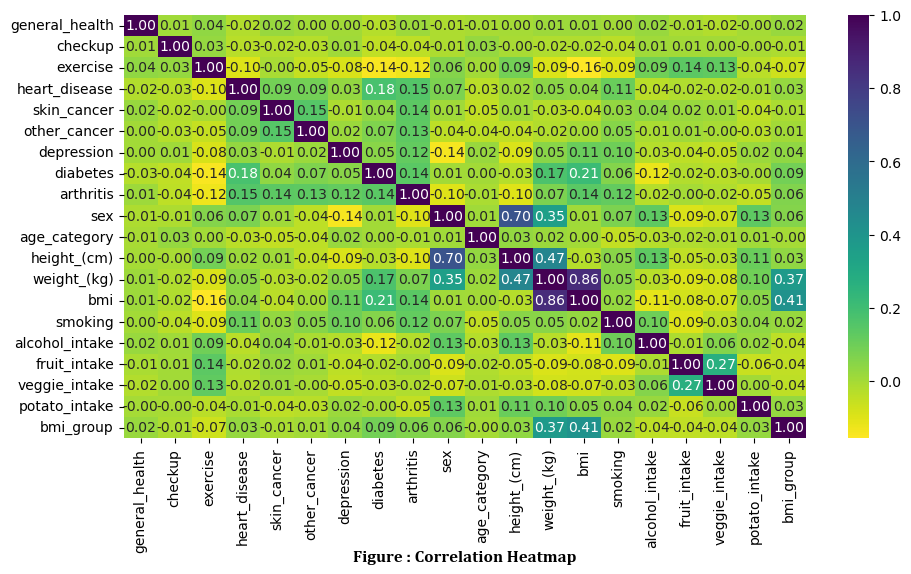

In [30]:
# Calculate the correlation matrix for Data
import matplotlib.pyplot as plt
import seaborn as sns
correlation_matrix = data.corr()

# Create a heatmap
plt.figure(figsize=(11, 5.5))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis_r', fmt=".2f")
#plt.title("Correlation Heatmap")
# Save the heatmap
#plt.savefig("heatmapup.png")
# Adding figure name at the bottom
plt.text(
    0.5,
    -0.28,
    "Figure : Correlation Heatmap",
    horizontalalignment='center',
    verticalalignment='center',
    transform=plt.gca().transAxes,  # To specify coordinates relative to the axes
    fontdict=dict(
        family="Cambria",
        size=12,
        color="black",
        weight="bold"
    )
)
plt.show()

Insights:

The correlation analysis revealed that people who have a diabetes have more chances of heart disease or we may from the correlation heatmap that people with diabetes are more vulnerable towards the CVD.

Also, people with diabetes and heart disease have a higher bmi on average.

Training and testing dataset

In [27]:
X = data.drop("heart_disease", axis = 1)
y = data['heart_disease']
X.shape

(308854, 19)

In [28]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)
# Warnings
import warnings 
warnings. filterwarnings('ignore')

C:\Users\posha\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\posha\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# Splitting the data into training and testing sets for diabetes balanced

X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.3, random_state=42)

In [30]:
#Feature Scaling on diabetes dataset
scaler_d = StandardScaler()
X_train_scaled = scaler_d.fit_transform(X_train)
X_test_scaled = scaler_d.transform(X_test)

In [31]:
# Create the models
from sklearn.linear_model import LogisticRegression
lr_d = LogisticRegression()
# Fit the models
lr_d.fit(X_train_scaled, y_train)
lr_pred_d = lr_d.predict(X_test_scaled)


In [32]:
from sklearn.ensemble import RandomForestClassifier
rf_d = RandomForestClassifier()
rf_d.fit(X_train, y_train)
rf_pred_d = rf_d.predict(X_test)

In [33]:
# import for decision tree
from sklearn.tree import DecisionTreeClassifier

In [34]:
# build the model and y_prediction
clf = DecisionTreeClassifier()
model = clf.fit(X_train,y_train)

y_pred_dec = model.predict(X_test)
y_pred_dec

array([0, 1, 1, ..., 0, 1, 1])

In [35]:
# Classification reports for different algorithms
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc
lr_d_report = classification_report(y_test, lr_pred_d)
dec_report = classification_report(y_test, y_pred_dec)
rf_d_report = classification_report(y_test, rf_pred_d)

In [36]:
# Print classification reports

print("="*20, "Logistic regression report:", "="*20, '\n')
print(lr_d_report)

print(  "="*20, "Decision tree report:", "="*20, '\n')
print(dec_report)

print("="*20, "Random forest report:", "="*20, '\n')
print(rf_d_report)

==================== Logistic regression report: ==================== 

              precision    recall  f1-score   support

           0       0.69      0.72      0.70     85071
           1       0.70      0.67      0.69     85259

    accuracy                           0.70    170330
   macro avg       0.70      0.70      0.70    170330
weighted avg       0.70      0.70      0.70    170330

==================== Decision tree report: ==================== 

              precision    recall  f1-score   support

           0       0.88      0.84      0.86     85071
           1       0.85      0.89      0.87     85259

    accuracy                           0.86    170330
   macro avg       0.86      0.86      0.86    170330
weighted avg       0.86      0.86      0.86    170330

==================== Random forest report: ==================== 

              precision    recall  f1-score   support

           0       0.92      0.90      0.91     85071
           1       0.90      0.93

In [37]:
import matplotlib.pyplot as plt

# Define the file names for the reports
file_names = ["lr_report.png", "dec_report.png", "rf_report.png"]

# Define the reports content
reports = [lr_d_report, dec_report, rf_d_report]

# Loop through each report and save it as an image
for file_name, report in zip(file_names, reports):
    plt.figure(figsize=(8, 6))
    plt.text(0.1, 0.5, report, fontsize=12)
    plt.axis('off')  # Turn off axis
    plt.savefig(file_name, bbox_inches='tight')
    plt.close()

print("Reports saved as images:", file_names)


Reports saved as images: ['lr_report.png', 'dec_report.png', 'rf_report.png']


In [38]:
# Calculate ROC and AUC for each model
import plotly.graph_objs as go
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_pred_d)
lr_auc = auc(lr_fpr, lr_tpr)

rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_pred_d)
rf_auc = auc(rf_fpr, rf_tpr)

dec_fpr, dec_tpr, _ = roc_curve(y_test, y_pred_dec)
dec_auc = auc(dec_fpr, dec_tpr)

In [31]:
# Create ROC curve plot using Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=lr_fpr, y=lr_tpr, mode='lines', name=f'Logistic Regression (AUC = {lr_auc:.2f})', line=dict(color=colors[1])))
fig.add_trace(go.Scatter(x=rf_fpr, y=rf_tpr, mode='lines', name=f'Random Forest (AUC = {rf_auc:.2f})', line=dict(color=colors[3])))
fig.add_trace(go.Scatter(x=dec_fpr, y=dec_tpr, mode='lines', name=f'Decision Tree (AUC = {dec_auc:.2f})', line=dict(color=colors[2])))
fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
fig.update_layout(xaxis=dict(title='False Positive Rate'), yaxis=dict(title='True Positive Rate'), legend=dict(x=0.7, y=0.2), autosize=False, width=900, height=500, plot_bgcolor='lightgrey')
# Adding figure name at the bottom
fig.add_annotation(
    x=0.5,
    y=-0.20,
    xref="paper",
    yref="paper",
    text="Figure: Receiver Operating Characteristic (ROC) Curve for heart disease",
    showarrow=False,
    font=dict(
        family="Cambria",
        size=12,
        color="black"
    )
)
fig.show()

NameError: name 'lr_fpr' is not defined

Conclusion:
Finally! 
we use three machine learning models random forest, decision tree and logistic regression to train and test the data. At the end machine learning analysis utilizing Random Forest performed best, with a remarkable F1-score and AUC of 0.91 which is followed by decision tree with 0.86 and then logistic regression with satisfying socre of 0.70. This indicates that random forest classifier is most efficient in predicting heart disease in this setting.

Thank you!

In [53]:
import keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [57]:
#model = Sequential()
#model.add(Dense(512, activation='relu', input_dim=19))
#model.add(Dense(512, activation='relu'))
#model.add(Dense(1, activation='sigmoid'))
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [60]:
model = Sequential()
model.add(Dense(256, activation='relu', input_dim=19))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
show = model.fit(X, y, epochs=10, batch_size=20, validation_split=0.3)

Epoch 1/10
10810/10810 [==============================] - 30s 3ms/step - loss: 0.2923 - accuracy: 0.9131 - val_loss: 0.2497 - val_accuracy: 0.9186
Epoch 2/10
10810/10810 [==============================] - 31s 3ms/step - loss: 0.2576 - accuracy: 0.9183 - val_loss: 0.2551 - val_accuracy: 0.9188
Epoch 3/10
10810/10810 [==============================] - 38s 3ms/step - loss: 0.2506 - accuracy: 0.9191 - val_loss: 0.2485 - val_accuracy: 0.9188
Epoch 4/10
10810/10810 [==============================] - 35s 3ms/step - loss: 0.2489 - accuracy: 0.9192 - val_loss: 0.2457 - val_accuracy: 0.9189
Epoch 5/10
10810/10810 [==============================] - 33s 3ms/step - loss: 0.2475 - accuracy: 0.9191 - val_loss: 0.2450 - val_accuracy: 0.9189
Epoch 6/10
10810/10810 [==============================] - 32s 3ms/step - loss: 0.2455 - accuracy: 0.9193 - val_loss: 0.2428 - val_accuracy: 0.9187
Epoch 7/10
10810/10810 [==============================] - 32s 3ms/step - loss: 0.2426 - accuracy: 0.9192 - val_loss: 0